In [1]:
import torch
from fastai.metrics import Metric

# Custom metric for Mean Absolute Percentage Error (MAPE)
class MAPE(Metric):
    def __init__(self):
        self.addition = 0
        self.count = 0
        self.eps = 1e-7  # Small epsilon value

    def reset(self):
        self.addition = 0
        self.count = 0

    def accumulate(self, learn):
        preds, targs = learn.pred, learn.y
        mask = targs != 0  # Ignore cases where the target is zero
        mape = torch.abs((targs - preds) / (targs + self.eps))  # Add eps to avoid division by zero
        mape = mape[mask]  # Apply the mask to ignore zero targets
        self.addition += mape.sum()
        self.count += len(mape)

    @property
    def value(self):
        return self.addition / self.count



In [2]:
from fastai.vision.all import *
import pandas as pd

# Load the data
df = pd.read_csv('../train/train.csv')

# Define the path to the folder containing the images
path = Path('../train/train')


In [3]:
# Filter rows with PCI less than zero
df_filtered = df[df['pci'] >= 0]

# Get the list of image names to remove
image_names_to_remove = df[~df.index.isin(df_filtered.index)]['image_name']


# Define the path to the folder containing the images
original_path = Path('../train/train')
backup_path = Path('../train/train_backup')  # Create a backup directory

# Create the backup directory if it doesn't exist
backup_path.mkdir(parents=True, exist_ok=True)

# Move the corresponding image files to the backup directory
for image_name in image_names_to_remove:
    original_image_path = original_path / image_name
    backup_image_path = backup_path / image_name
    if original_image_path.exists():
        os.rename(original_image_path, backup_image_path)
        print(f"Moved {image_name} to the backup directory.")

# Update the dataframe (if needed)
df = df_filtered

In [4]:
fns = get_image_files(path)
len(fns)

7685

In [5]:
failed = verify_images(fns)

KeyboardInterrupt: 

In [ ]:
failed.map(Path.unlink)
failed

In [7]:
from fastai.vision.image.transform import RandomBrightness


ModuleNotFoundError: No module named 'fastai.vision.image'

In [9]:
item_tfms = RandomResizedCrop(224, min_scale=0.7)
#item_tfms = item_tfms * RandomBrightness(brightness=(-0.2,0.2))  
# Define the data block
dblock = DataBlock(blocks=(ImageBlock, RegressionBlock),
                   get_x=ColReader('image_name', pref=path),
                   get_y=ColReader('pci'),
                   splitter=RandomSplitter(valid_pct=0.2, seed=42),
                   item_tfms=item_tfms)

# Create the dataloader
dls = dblock.dataloaders(df, batch_size=32)

epoch,train_loss,valid_loss,mae,time
0,1136.376953,896.366516,21.491798,00:37


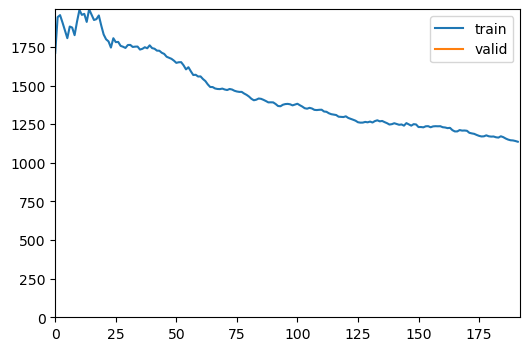

epoch,train_loss,valid_loss,mae,time
0,895.217041,658.013000,18.120317,00:35
1,722.721680,510.416321,15.865237,00:36
2,620.554260,458.293091,14.853025,00:35
3,528.927673,393.046234,13.715654,00:39
4,443.669708,362.678406,13.350477,00:36
5,375.024933,342.089539,12.819069,00:38
6,333.017731,319.099396,12.680552,00:36
7,307.810059,295.224548,12.118831,00:39
8,259.854614,324.905579,12.849719,00:35
9,258.976868,305.741333,11.995602,00:39


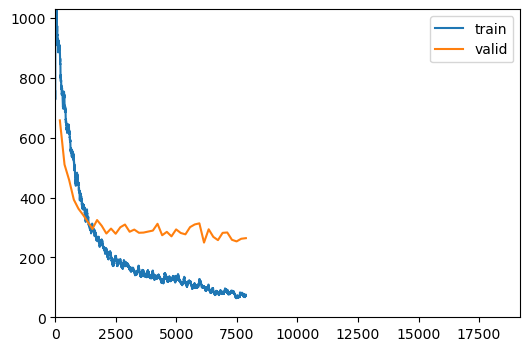

No improvement since epoch 31: early stopping


In [10]:
# Create the learner
learn = vision_learner(dls, resnet34, metrics=mae, cbs=[EarlyStoppingCallback(patience=10), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='resnet34_model')],y_range=(-0.5,100.5))

# Train the model
learn.fine_tune(100)

/home/rayeed/mambaforge/lib/python3.10/site-packages/fastai/learner.py:59: UserWarning: Saved file doesn't contain an optimizer state.
  elif with_opt: warn("Saved file doesn't contain an optimizer state.")


epoch,train_loss,valid_loss,mae,time
0,66.336876,261.304901,10.578434,00:33


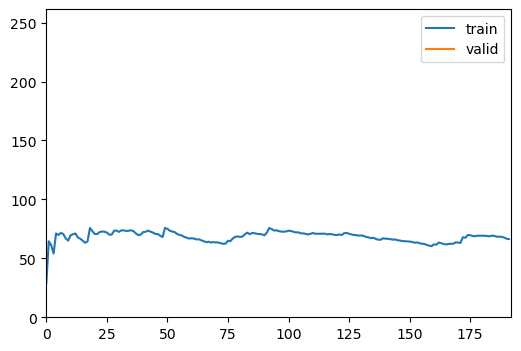

epoch,train_loss,valid_loss,mae,time
0,49.242985,253.099503,9.954614,00:34
1,48.566879,240.202362,9.767161,00:35
2,40.219959,235.979828,9.899482,00:35
3,37.575916,235.080673,9.804014,00:34
4,39.636585,247.162384,10.224325,00:38
5,33.274170,237.969070,10.023705,00:35
6,33.718082,241.043259,9.679500,00:37
7,32.798523,240.713257,9.678996,00:35
8,30.597523,246.043060,9.892054,00:39
9,34.717232,252.650421,10.056003,00:37


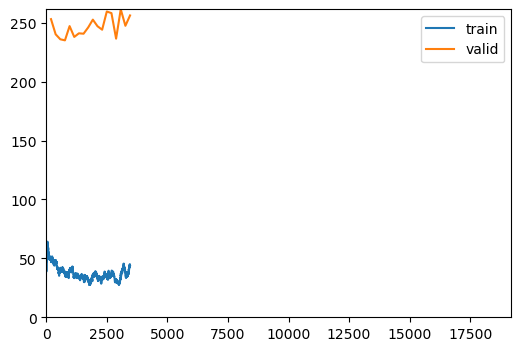

No improvement since epoch 3: early stopping


In [11]:
# Create the learner
learn = vision_learner(dls, resnet34, metrics=mae, cbs=[EarlyStoppingCallback(patience=15), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='resnet34_modelnew')],y_range=(-0.5,100.5))
learn.load('resnet34_model_37')
# Train the model
learn.fine_tune(100)

In [33]:
from fastai.vision.all import Resize
from tqdm import tqdm

test_path = Path('../test')
rows = []
num_images = len(list(test_path.glob('**/*.jpg')))
pbar = tqdm(total=num_images)  # Initialize the progress bar with total number of images
learn = vision_learner(dls, resnet34, metrics=mae, cbs=[EarlyStoppingCallback(patience=15), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='resnet34_modelnew')],y_range=(-0.5,100.5))
learn.load('resnet34_model_31')
for i, tst_img in enumerate(test_path.glob('**/*.jpg')):
    try:
        #tst_img = Resize(224)(tst_img)
        preds = learn.predict(tst_img)
        pred_value = preds[0][0]  # Extract the predicted value from the tuple
    except OSError as e:
        pred_value = 50  # Set a default value if there's an OSError
    rows.append({'image_name': os.path.basename(tst_img),
                 'pci': pred_value})

    # Update the progress bar every 100 images
    if (i + 1) % 100 == 0:
        pbar.update(100)

# Update the progress bar to show completion
pbar.update(num_images - (i + 1) % 100)
pbar.close()

df_test = pd.DataFrame(rows)
import json
# df: should have two columns - image_name and PCI
def gen_submit(df):
  out_json = []
  for idx, results in df.iterrows():
    out_json.append({results['image_name']:results['pci']})
  with open('submission.json', 'w') as f:
    json.dump(out_json, f)

gen_submit(df_test)

  0%|                                                                              | 0/3302 [00:00<?, ?it/s]

  3%|██                                                                  | 100/3302 [00:11<06:12,  8.60it/s]

  6%|████                                                                | 200/3302 [00:19<04:47, 10.77it/s]

  9%|██████▏                                                             | 300/3302 [00:26<04:14, 11.79it/s]

 12%|████████▏                                                           | 400/3302 [00:34<03:56, 12.25it/s]

 15%|██████████▎                                                         | 500/3302 [00:42<03:44, 12.47it/s]

 18%|████████████▎                                                       | 600/3302 [00:50<03:35, 12.56it/s]

 21%|██████████████▍                                                     | 700/3302 [00:57<03:24, 12.71it/s]

 24%|████████████████▍                                                   | 800/3302 [01:05<03:12, 13.00it/s]

 27%|██████████████████▌                                                 | 900/3302 [01:12<03:03, 13.10it/s]

 30%|████████████████████▎                                              | 1000/3302 [01:19<02:53, 13.25it/s]

 33%|██████████████████████▎                                            | 1100/3302 [01:27<02:45, 13.33it/s]

 36%|████████████████████████▎                                          | 1200/3302 [01:35<02:40, 13.14it/s]

 39%|██████████████████████████▍                                        | 1300/3302 [01:42<02:31, 13.19it/s]

 42%|████████████████████████████▍                                      | 1400/3302 [01:50<02:22, 13.31it/s]

 45%|██████████████████████████████▍                                    | 1500/3302 [01:57<02:15, 13.29it/s]

 48%|████████████████████████████████▍                                  | 1600/3302 [02:05<02:07, 13.32it/s]

 51%|██████████████████████████████████▍                                | 1700/3302 [02:12<02:01, 13.17it/s]

 55%|████████████████████████████████████▌                              | 1800/3302 [02:20<01:53, 13.28it/s]

 58%|██████████████████████████████████████▌                            | 1900/3302 [02:27<01:46, 13.21it/s]

 61%|████████████████████████████████████████▌                          | 2000/3302 [02:35<01:38, 13.25it/s]

 64%|██████████████████████████████████████████▌                        | 2100/3302 [02:42<01:30, 13.34it/s]

 67%|████████████████████████████████████████████▋                      | 2200/3302 [02:50<01:21, 13.49it/s]

 70%|██████████████████████████████████████████████▋                    | 2300/3302 [02:57<01:13, 13.54it/s]

 73%|████████████████████████████████████████████████▋                  | 2400/3302 [03:04<01:06, 13.48it/s]

 76%|██████████████████████████████████████████████████▋                | 2500/3302 [03:12<01:00, 13.28it/s]

 79%|████████████████████████████████████████████████████▊              | 2600/3302 [03:20<00:52, 13.27it/s]

 82%|██████████████████████████████████████████████████████▊            | 2700/3302 [03:26<00:44, 13.68it/s]

 85%|████████████████████████████████████████████████████████▊          | 2800/3302 [03:34<00:36, 13.78it/s]

 88%|██████████████████████████████████████████████████████████▊        | 2900/3302 [03:41<00:29, 13.61it/s]

 91%|████████████████████████████████████████████████████████████▊      | 3000/3302 [03:49<00:22, 13.40it/s]

 94%|██████████████████████████████████████████████████████████████▉    | 3100/3302 [03:57<00:15, 13.31it/s]

 97%|████████████████████████████████████████████████████████████████▉  | 3200/3302 [04:04<00:07, 13.34it/s]

100%|██████████████████████████████████████████████████████████████████▉| 3300/3302 [04:12<00:00, 13.27it/s]

6600it [04:12, 26.17it/s]                                                                                   


epoch,train_loss,valid_loss,mae,time
0,1256.802246,994.114990,22.648605,00:42


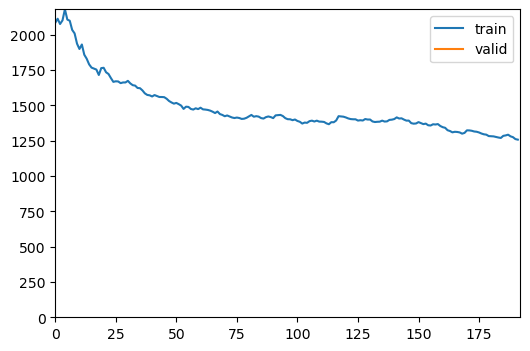

epoch,train_loss,valid_loss,mae,time
0,974.799377,734.207520,19.485752,00:49
1,808.434387,577.528442,17.024305,00:47
2,690.205383,513.010315,16.109640,00:48
3,594.846619,461.518738,15.407766,00:49
4,526.726074,412.455963,14.778605,00:49
5,472.481567,373.768463,14.169315,00:49
6,420.425049,335.798096,13.428740,01:01
7,373.509979,317.797821,12.964487,00:47
8,336.326050,299.823669,12.669482,00:49
9,317.014618,303.623810,12.608048,00:49


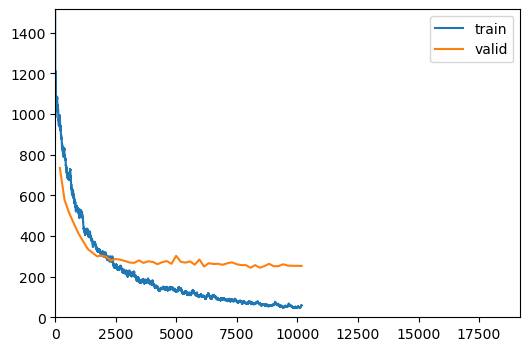

No improvement since epoch 43: early stopping


In [16]:
# Create the learner
learn = vision_learner(dls, resnet50, metrics=mae, cbs=[EarlyStoppingCallback(patience=10), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='resnet50_modelnew')],y_range=(-0.5,100.5))

# Train the model
learn.fine_tune(100)

epoch,train_loss,valid_loss,mae,time
0,64.946991,250.735489,10.512897,00:42


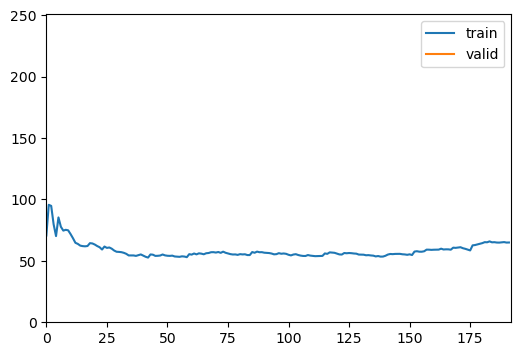

epoch,train_loss,valid_loss,mae,time
0,47.454533,240.071198,10.007145,00:47
1,49.005840,232.161865,9.866199,00:48
2,40.543068,239.556976,10.014953,00:47
3,44.430847,233.060165,9.850796,00:49
4,38.733242,236.521820,9.831667,00:48
5,39.993263,233.924347,9.665855,00:50
6,40.879463,239.969650,9.740055,00:48
7,41.857368,242.341064,9.978692,00:49
8,35.745682,235.469620,9.680748,00:48
9,41.745232,241.096909,9.733561,00:50


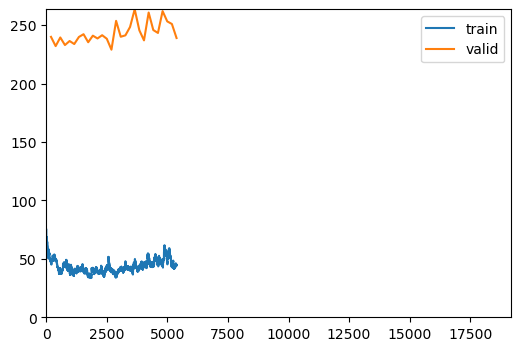

No improvement since epoch 13: early stopping


In [18]:
# Create the learner
learn = vision_learner(dls, resnet50, metrics=mae, cbs=[EarlyStoppingCallback(patience=15), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='resnet50_modelnew2')],y_range=(-0.5,100.5))
learn.load('resnet50_modelnew_43')
# Train the model
learn.fine_tune(100)

In [27]:
from fastai.vision.all import Resize
from tqdm import tqdm

test_path = Path('../test')
rows = []
num_images = len(list(test_path.glob('**/*.jpg')))
pbar = tqdm(total=num_images)  # Initialize the progress bar with total number of images
learn = vision_learner(dls, resnet50, metrics=mae, cbs=[EarlyStoppingCallback(patience=10), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='resnet50_modelnew')],y_range=(-0.5,100.5))
learn.load('resnet50_modelnew_13')
for i, tst_img in enumerate(test_path.glob('**/*.jpg')):
    try:
        #tst_img = Resize(224)(tst_img)
        preds = learn.predict(tst_img)
        pred_value = preds[0][0]  # Extract the predicted value from the tuple
    except OSError as e:
        pred_value = 50  # Set a default value if there's an OSError
    rows.append({'image_name': os.path.basename(tst_img),
                 'pci': pred_value})

    # Update the progress bar every 100 images
    if (i + 1) % 100 == 0:
        pbar.update(100)

# Update the progress bar to show completion
pbar.update(num_images - (i + 1) % 100)
pbar.close()

df_test = pd.DataFrame(rows)
import json
# df: should have two columns - image_name and PCI
def gen_submit(df):
  out_json = []
  for idx, results in df.iterrows():
    out_json.append({results['image_name']:results['pci']})
  with open('submission.json', 'w') as f:
    json.dump(out_json, f)

gen_submit(df_test)

  0%|                                                                              | 0/3302 [00:00<?, ?it/s]

  3%|██                                                                  | 100/3302 [00:07<03:57, 13.46it/s]

  6%|████                                                                | 200/3302 [00:14<03:35, 14.41it/s]

  9%|██████▏                                                             | 300/3302 [00:21<03:34, 14.01it/s]

 12%|████████▏                                                           | 400/3302 [00:28<03:26, 14.05it/s]

 15%|██████████▎                                                         | 500/3302 [00:35<03:16, 14.29it/s]

 18%|████████████▎                                                       | 600/3302 [00:42<03:07, 14.45it/s]

 21%|██████████████▍                                                     | 700/3302 [00:49<03:02, 14.29it/s]

 24%|████████████████▍                                                   | 800/3302 [00:56<02:57, 14.10it/s]

 27%|██████████████████▌                                                 | 900/3302 [01:03<02:50, 14.11it/s]

 30%|████████████████████▎                                              | 1000/3302 [01:10<02:43, 14.10it/s]

 33%|██████████████████████▎                                            | 1100/3302 [01:17<02:35, 14.16it/s]

 36%|████████████████████████▎                                          | 1200/3302 [01:24<02:29, 14.10it/s]

 39%|██████████████████████████▍                                        | 1300/3302 [01:32<02:23, 13.92it/s]

 42%|████████████████████████████▍                                      | 1400/3302 [01:38<02:12, 14.37it/s]

 45%|██████████████████████████████▍                                    | 1500/3302 [01:45<02:04, 14.45it/s]

 48%|████████████████████████████████▍                                  | 1600/3302 [01:52<01:58, 14.36it/s]

 51%|██████████████████████████████████▍                                | 1700/3302 [01:59<01:52, 14.28it/s]

 55%|████████████████████████████████████▌                              | 1800/3302 [02:05<01:41, 14.83it/s]

 58%|██████████████████████████████████████▌                            | 1900/3302 [02:12<01:36, 14.59it/s]

 61%|████████████████████████████████████████▌                          | 2000/3302 [02:19<01:27, 14.92it/s]

 64%|██████████████████████████████████████████▌                        | 2100/3302 [02:26<01:22, 14.50it/s]

 67%|████████████████████████████████████████████▋                      | 2200/3302 [02:33<01:16, 14.42it/s]

 70%|██████████████████████████████████████████████▋                    | 2300/3302 [02:39<01:07, 14.81it/s]

 73%|████████████████████████████████████████████████▋                  | 2400/3302 [02:47<01:01, 14.57it/s]

 76%|██████████████████████████████████████████████████▋                | 2500/3302 [02:53<00:54, 14.76it/s]

 79%|████████████████████████████████████████████████████▊              | 2600/3302 [03:00<00:47, 14.84it/s]

 82%|██████████████████████████████████████████████████████▊            | 2700/3302 [03:06<00:39, 15.06it/s]

 85%|████████████████████████████████████████████████████████▊          | 2800/3302 [03:13<00:33, 14.80it/s]

 88%|██████████████████████████████████████████████████████████▊        | 2900/3302 [03:21<00:27, 14.45it/s]

 91%|████████████████████████████████████████████████████████████▊      | 3000/3302 [03:27<00:20, 14.46it/s]

 94%|██████████████████████████████████████████████████████████████▉    | 3100/3302 [03:34<00:13, 14.72it/s]

 97%|████████████████████████████████████████████████████████████████▉  | 3200/3302 [03:41<00:06, 14.64it/s]

100%|██████████████████████████████████████████████████████████████████▉| 3300/3302 [03:48<00:00, 14.30it/s]

6600it [03:48, 28.84it/s]                                                                                   


epoch,train_loss,valid_loss,mae,time
0,1137.458130,806.902832,20.397167,00:34


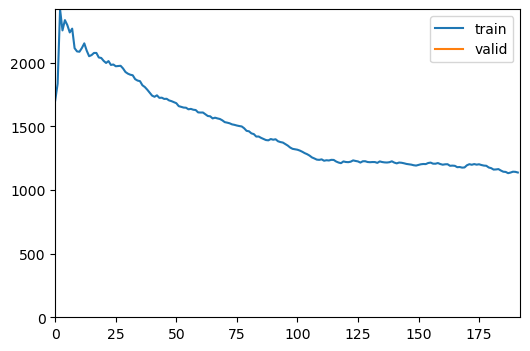

epoch,train_loss,valid_loss,mae,time
0,794.512634,596.354126,17.676065,00:34
1,694.313721,531.719971,16.697994,00:33
2,590.832581,446.227478,14.932234,00:33
3,538.808105,413.944580,14.513033,00:34
4,487.971558,369.362244,13.834518,00:35
5,413.066223,356.201080,13.723110,00:38
6,365.336304,323.331238,13.177016,00:34
7,326.225555,316.843475,12.713713,00:34
8,297.636597,315.852295,12.883451,00:38
9,281.040283,311.274841,12.584585,00:35


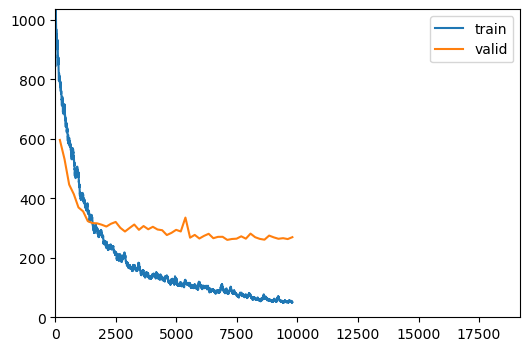

No improvement since epoch 36: early stopping


In [21]:
# Create the learner
learn = vision_learner(dls, resnet18, metrics=mae, cbs=[EarlyStoppingCallback(patience=15), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='resnet18_modelnew')],y_range=(-0.5,100.5))

# Train the model
learn.fine_tune(100)

In [22]:
from fastai.vision.all import Resize
from tqdm import tqdm

test_path = Path('../test')
rows = []
num_images = len(list(test_path.glob('**/*.jpg')))
pbar = tqdm(total=num_images)  # Initialize the progress bar with total number of images
learn = vision_learner(dls, resnet18, metrics=mae, cbs=[EarlyStoppingCallback(patience=15), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='resnet18_modelnew')],y_range=(-0.5,100.5))
learn.load('resnet18_modelnew_36')
for i, tst_img in enumerate(test_path.glob('**/*.jpg')):
    try:
        #tst_img = Resize(224)(tst_img)
        preds = learn.predict(tst_img)
        pred_value = preds[0][0]  # Extract the predicted value from the tuple
    except OSError as e:
        pred_value = 50  # Set a default value if there's an OSError
    rows.append({'image_name': os.path.basename(tst_img),
                 'pci': pred_value})

    # Update the progress bar every 100 images
    if (i + 1) % 100 == 0:
        pbar.update(100)

# Update the progress bar to show completion
pbar.update(num_images - (i + 1) % 100)
pbar.close()

df_test = pd.DataFrame(rows)
import json
# df: should have two columns - image_name and PCI
def gen_submit(df):
  out_json = []
  for idx, results in df.iterrows():
    out_json.append({results['image_name']:results['pci']})
  with open('submission.json', 'w') as f:
    json.dump(out_json, f)

gen_submit(df_test)

  0%|                                                                              | 0/3302 [00:00<?, ?it/s]

  3%|██                                                                  | 100/3302 [00:07<03:55, 13.58it/s]

  6%|████                                                                | 200/3302 [00:13<03:19, 15.55it/s]

  9%|██████▏                                                             | 300/3302 [00:19<03:10, 15.73it/s]

 12%|████████▏                                                           | 400/3302 [00:24<02:54, 16.59it/s]

 15%|██████████▎                                                         | 500/3302 [00:31<02:55, 15.94it/s]

 18%|████████████▎                                                       | 600/3302 [00:38<02:51, 15.79it/s]

 21%|██████████████▍                                                     | 700/3302 [00:44<02:48, 15.45it/s]

 24%|████████████████▍                                                   | 800/3302 [00:51<02:40, 15.59it/s]

 27%|██████████████████▌                                                 | 900/3302 [00:57<02:32, 15.79it/s]

 30%|████████████████████▎                                              | 1000/3302 [01:03<02:24, 15.97it/s]

 33%|██████████████████████▎                                            | 1100/3302 [01:09<02:19, 15.81it/s]

 36%|████████████████████████▎                                          | 1200/3302 [01:16<02:12, 15.83it/s]

 39%|██████████████████████████▍                                        | 1300/3302 [01:22<02:06, 15.82it/s]

 42%|████████████████████████████▍                                      | 1400/3302 [01:29<02:04, 15.29it/s]

 45%|██████████████████████████████▍                                    | 1500/3302 [01:36<01:59, 15.05it/s]

 48%|████████████████████████████████▍                                  | 1600/3302 [01:43<01:52, 15.08it/s]

 51%|██████████████████████████████████▍                                | 1700/3302 [01:49<01:45, 15.24it/s]

 55%|████████████████████████████████████▌                              | 1800/3302 [01:55<01:38, 15.31it/s]

 58%|██████████████████████████████████████▌                            | 1900/3302 [02:02<01:32, 15.09it/s]

 61%|████████████████████████████████████████▌                          | 2000/3302 [02:09<01:27, 14.83it/s]

 64%|██████████████████████████████████████████▌                        | 2100/3302 [02:16<01:20, 14.87it/s]

 67%|████████████████████████████████████████████▋                      | 2200/3302 [02:23<01:14, 14.78it/s]

 70%|██████████████████████████████████████████████▋                    | 2300/3302 [02:29<01:07, 14.94it/s]

 73%|████████████████████████████████████████████████▋                  | 2400/3302 [02:35<00:58, 15.40it/s]

 76%|██████████████████████████████████████████████████▋                | 2500/3302 [02:42<00:52, 15.16it/s]

 79%|████████████████████████████████████████████████████▊              | 2600/3302 [02:49<00:47, 14.86it/s]

 82%|██████████████████████████████████████████████████████▊            | 2700/3302 [02:55<00:39, 15.23it/s]

 85%|████████████████████████████████████████████████████████▊          | 2800/3302 [03:02<00:32, 15.25it/s]

 88%|██████████████████████████████████████████████████████████▊        | 2900/3302 [03:08<00:25, 15.54it/s]

 91%|████████████████████████████████████████████████████████████▊      | 3000/3302 [03:14<00:19, 15.68it/s]

 94%|██████████████████████████████████████████████████████████████▉    | 3100/3302 [03:21<00:12, 15.76it/s]

 97%|████████████████████████████████████████████████████████████████▉  | 3200/3302 [03:27<00:06, 15.69it/s]

100%|██████████████████████████████████████████████████████████████████▉| 3300/3302 [03:34<00:00, 15.33it/s]

6600it [03:34, 30.76it/s]                                                                                   


Downloading: "https://download.pytorch.org/models/resnet101-cd907fc2.pth" to /home/rayeed/.cache/torch/hub/checkpoints/resnet101-cd907fc2.pth
100%|████████████████████████████████████████████████████████████████████| 171M/171M [00:21<00:00, 8.51MB/s]


epoch,train_loss,valid_loss,mae,time
0,1263.774414,987.343994,22.681170,00:55


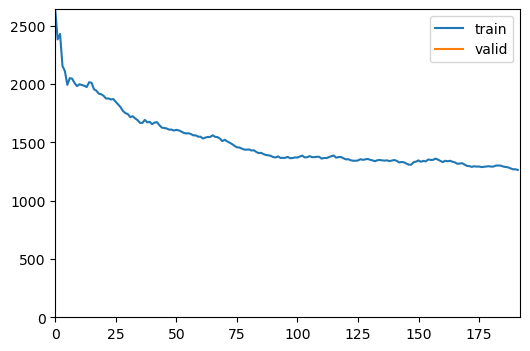

epoch,train_loss,valid_loss,mae,time
0,928.386230,749.761963,19.714806,01:08
1,787.906921,641.556824,18.192844,01:09
2,674.064453,534.218140,16.884375,01:10
3,597.597290,483.273499,16.019270,01:09
4,569.667419,424.845245,15.456041,01:09
5,485.409180,378.609924,14.527844,01:09
6,433.422180,355.455719,14.096153,01:10
7,376.726898,327.301483,13.482537,01:09
8,358.831207,321.785675,13.460934,01:09
9,342.113068,316.498077,13.468693,01:10


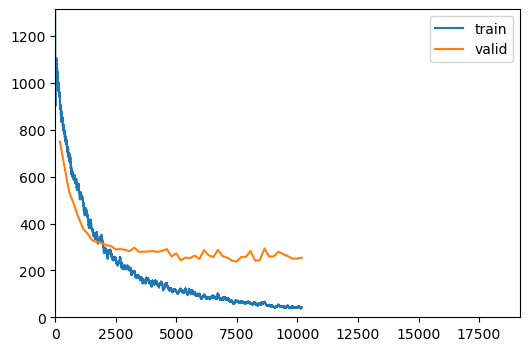

No improvement since epoch 38: early stopping


In [25]:
# Create the learner
learn = vision_learner(dls, resnet101, metrics=mae, cbs=[EarlyStoppingCallback(patience=15), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='resnet101_modelnew')],y_range=(-0.5,100.5))
learn.load('resnet101_modelnew_9')
# Train the model
learn.fine_tune(100)

# Use a learning rate scheduler (e.g., ReduceLROnPlateau)
learn.lr_scheduler = ReduceLROnPlateau(patience=5)

epoch,train_loss,valid_loss,mae,time
0,319.195496,331.410278,13.509707,01:03


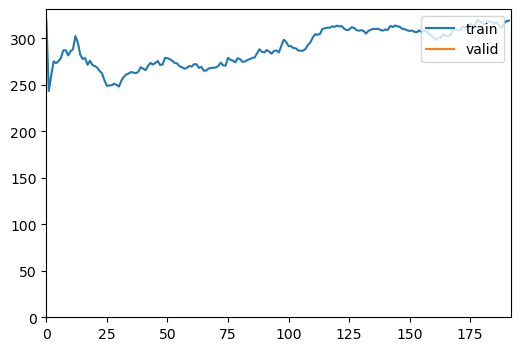

epoch,train_loss,valid_loss,mae,time
0,271.279419,295.087555,12.682631,01:14
1,271.400787,291.046814,12.512262,01:15
2,239.396973,290.505676,12.226445,01:17
3,243.224060,288.850311,12.545947,01:16
4,208.537842,280.299316,11.957910,01:15
5,203.217941,285.492676,12.079763,01:16
6,189.491776,266.810913,11.893126,01:16
7,182.323654,287.582581,12.079280,01:16
8,182.259125,277.892670,11.672265,01:16
9,178.342346,273.638306,11.485200,01:15


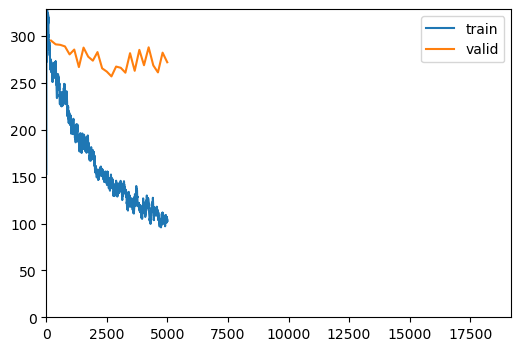

KeyboardInterrupt: 

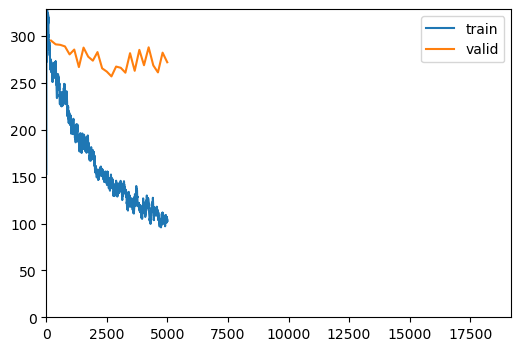

In [32]:
# Create the learner
learn = vision_learner(dls, resnet101, metrics=mae, cbs=[EarlyStoppingCallback(patience=15), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='resnet101_modelnew')],y_range=(-0.5,100.5))
learn.load('resnet101_modelnew_9')
# Train the model
learn.fine_tune(100)

# Use a learning rate scheduler (e.g., ReduceLROnPlateau)
learn.lr_scheduler = ReduceLROnPlateau(patience=5)

In [26]:
from fastai.vision.all import Resize
from tqdm import tqdm

test_path = Path('../test')
rows = []
num_images = len(list(test_path.glob('**/*.jpg')))
pbar = tqdm(total=num_images)  # Initialize the progress bar with total number of images
learn = vision_learner(dls, resnet101, metrics=mae, cbs=[EarlyStoppingCallback(patience=15), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='resnet101_modelnew')],y_range=(-0.5,100.5))
learn.load('resnet101_modelnew_12')
for i, tst_img in enumerate(test_path.glob('**/*.jpg')):
    try:
        #tst_img = Resize(224)(tst_img)
        preds = learn.predict(tst_img)
        pred_value = preds[0][0]  # Extract the predicted value from the tuple
    except OSError as e:
        pred_value = 50  # Set a default value if there's an OSError
    rows.append({'image_name': os.path.basename(tst_img),
                 'pci': pred_value})

    # Update the progress bar every 100 images
    if (i + 1) % 100 == 0:
        pbar.update(100)

# Update the progress bar to show completion
pbar.update(num_images - (i + 1) % 100)
pbar.close()

df_test = pd.DataFrame(rows)
import json
# df: should have two columns - image_name and PCI
def gen_submit(df):
  out_json = []
  for idx, results in df.iterrows():
    out_json.append({results['image_name']:results['pci']})
  with open('submission.json', 'w') as f:
    json.dump(out_json, f)

gen_submit(df_test)

  0%|                                                                              | 0/3302 [00:00<?, ?it/s]

  3%|██                                                                  | 100/3302 [00:10<05:48,  9.20it/s]

  6%|████                                                                | 200/3302 [00:18<04:43, 10.96it/s]

  9%|██████▏                                                             | 300/3302 [00:26<04:10, 11.99it/s]

 12%|████████▏                                                           | 400/3302 [00:34<03:59, 12.13it/s]

 15%|██████████▎                                                         | 500/3302 [00:41<03:44, 12.50it/s]

 18%|████████████▎                                                       | 600/3302 [00:48<03:28, 12.97it/s]

 21%|██████████████▍                                                     | 700/3302 [00:56<03:20, 13.00it/s]

 24%|████████████████▍                                                   | 800/3302 [01:04<03:12, 13.03it/s]

 27%|██████████████████▌                                                 | 900/3302 [01:12<03:07, 12.81it/s]

 30%|████████████████████▎                                              | 1000/3302 [01:19<02:56, 13.02it/s]

 33%|██████████████████████▎                                            | 1100/3302 [01:27<02:52, 12.75it/s]

 36%|████████████████████████▎                                          | 1200/3302 [01:35<02:42, 12.91it/s]

 39%|██████████████████████████▍                                        | 1300/3302 [01:43<02:36, 12.77it/s]

 42%|████████████████████████████▍                                      | 1400/3302 [01:50<02:26, 13.00it/s]

 45%|██████████████████████████████▍                                    | 1500/3302 [01:59<02:21, 12.73it/s]

 48%|████████████████████████████████▍                                  | 1600/3302 [02:06<02:12, 12.89it/s]

 51%|██████████████████████████████████▍                                | 1700/3302 [02:15<02:07, 12.52it/s]

 55%|████████████████████████████████████▌                              | 1800/3302 [02:23<02:01, 12.40it/s]

 58%|██████████████████████████████████████▌                            | 1900/3302 [02:31<01:53, 12.35it/s]

 61%|████████████████████████████████████████▌                          | 2000/3302 [02:39<01:45, 12.32it/s]

 64%|██████████████████████████████████████████▌                        | 2100/3302 [02:47<01:36, 12.46it/s]

 67%|████████████████████████████████████████████▋                      | 2200/3302 [02:55<01:29, 12.28it/s]

 70%|██████████████████████████████████████████████▋                    | 2300/3302 [03:04<01:21, 12.24it/s]

 73%|████████████████████████████████████████████████▋                  | 2400/3302 [03:11<01:09, 12.89it/s]

 76%|██████████████████████████████████████████████████▋                | 2500/3302 [03:19<01:03, 12.60it/s]

 79%|████████████████████████████████████████████████████▊              | 2600/3302 [03:27<00:55, 12.67it/s]

 82%|██████████████████████████████████████████████████████▊            | 2700/3302 [03:35<00:47, 12.68it/s]

 85%|████████████████████████████████████████████████████████▊          | 2800/3302 [03:43<00:40, 12.51it/s]

 88%|██████████████████████████████████████████████████████████▊        | 2900/3302 [03:51<00:32, 12.35it/s]

 91%|████████████████████████████████████████████████████████████▊      | 3000/3302 [03:59<00:24, 12.44it/s]

 94%|██████████████████████████████████████████████████████████████▉    | 3100/3302 [04:07<00:16, 12.54it/s]

 97%|████████████████████████████████████████████████████████████████▉  | 3200/3302 [04:15<00:08, 12.57it/s]

100%|██████████████████████████████████████████████████████████████████▉| 3300/3302 [04:22<00:00, 12.98it/s]

6600it [04:22, 25.14it/s]                                                                                   


epoch,train_loss,valid_loss,mae,time
0,1219.831787,1001.178589,23.090919,00:35


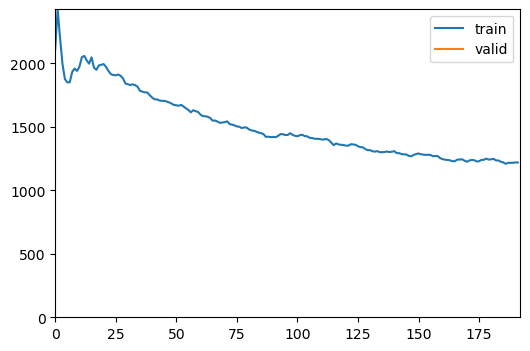

epoch,train_loss,valid_loss,mae,time
0,883.936890,744.026245,19.391581,00:35
1,792.118835,621.105225,17.992018,00:35
2,712.757446,570.251160,17.411749,00:37
3,648.343994,500.003204,16.250418,00:42
4,611.674316,451.878418,15.688833,00:37
5,547.563721,431.815460,15.530547,00:37
6,522.653137,420.333923,15.231263,00:37
7,463.965363,394.574707,15.068898,00:40
8,451.127441,391.355438,14.756057,00:44
9,440.737823,386.544861,14.834978,00:37


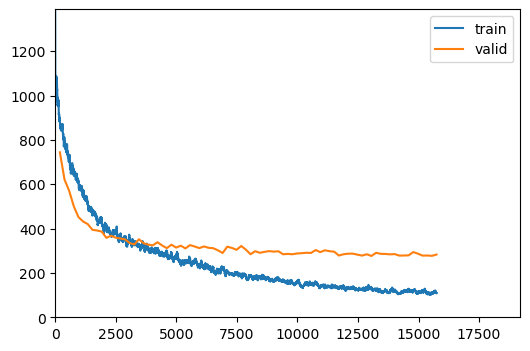

No improvement since epoch 67: early stopping


In [29]:
# Create the learner
learn = vision_learner(dls, googlenet, metrics=mae, cbs=[EarlyStoppingCallback(patience=15), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='googlenet')],y_range=(-0.5,100.5))

# Use a learning rate scheduler (e.g., ReduceLROnPlateau)
learn.lr_scheduler = ReduceLROnPlateau(patience=5)

# Train the model
learn.fine_tune(100)

In [31]:
from fastai.vision.all import Resize
from tqdm import tqdm

test_path = Path('../test')
rows = []
num_images = len(list(test_path.glob('**/*.jpg')))
pbar = tqdm(total=num_images)  # Initialize the progress bar with total number of images
learn = vision_learner(dls, googlenet, metrics=mae, cbs=[EarlyStoppingCallback(patience=15), ShowGraphCallback(),SaveModelCallback(every_epoch=True,fname='googlenet')],y_range=(-0.5,100.5))
learn.load('googlenet_67')
for i, tst_img in enumerate(test_path.glob('**/*.jpg')):
    try:
        #tst_img = Resize(224)(tst_img)
        preds = learn.predict(tst_img)
        pred_value = preds[0][0]  # Extract the predicted value from the tuple
    except OSError as e:
        pred_value = 50  # Set a default value if there's an OSError
    rows.append({'image_name': os.path.basename(tst_img),
                 'pci': pred_value})

    # Update the progress bar every 100 images
    if (i + 1) % 100 == 0:
        pbar.update(100)

# Update the progress bar to show completion
pbar.update(num_images - (i + 1) % 100)
pbar.close()

df_test = pd.DataFrame(rows)
import json
# df: should have two columns - image_name and PCI
def gen_submit(df):
  out_json = []
  for idx, results in df.iterrows():
    out_json.append({results['image_name']:results['pci']})
  with open('submission.json', 'w') as f:
    json.dump(out_json, f)

gen_submit(df_test)

  0%|                                                                              | 0/3302 [00:00<?, ?it/s]

  3%|██                                                                  | 100/3302 [00:07<03:59, 13.35it/s]

  6%|████                                                                | 200/3302 [00:14<03:40, 14.07it/s]

  9%|██████▏                                                             | 300/3302 [00:21<03:31, 14.17it/s]

 12%|████████▏                                                           | 400/3302 [00:28<03:22, 14.32it/s]

 15%|██████████▎                                                         | 500/3302 [00:35<03:16, 14.29it/s]

 18%|████████████▎                                                       | 600/3302 [00:42<03:08, 14.32it/s]

 21%|██████████████▍                                                     | 700/3302 [00:49<03:03, 14.17it/s]

 24%|████████████████▍                                                   | 800/3302 [00:56<02:56, 14.16it/s]

 27%|██████████████████▌                                                 | 900/3302 [01:03<02:52, 13.95it/s]

 30%|████████████████████▎                                              | 1000/3302 [01:10<02:43, 14.10it/s]

 33%|██████████████████████▎                                            | 1100/3302 [01:17<02:34, 14.24it/s]

 36%|████████████████████████▎                                          | 1200/3302 [01:24<02:27, 14.27it/s]

 39%|██████████████████████████▍                                        | 1300/3302 [01:31<02:20, 14.29it/s]

 42%|████████████████████████████▍                                      | 1400/3302 [01:38<02:14, 14.14it/s]

 45%|██████████████████████████████▍                                    | 1500/3302 [01:46<02:08, 14.07it/s]

 48%|████████████████████████████████▍                                  | 1600/3302 [01:53<02:02, 13.90it/s]

 51%|██████████████████████████████████▍                                | 1700/3302 [02:00<01:53, 14.06it/s]

 55%|████████████████████████████████████▌                              | 1800/3302 [02:07<01:46, 14.13it/s]

 58%|██████████████████████████████████████▌                            | 1900/3302 [02:14<01:38, 14.31it/s]

 61%|████████████████████████████████████████▌                          | 2000/3302 [02:22<01:34, 13.77it/s]

 64%|██████████████████████████████████████████▌                        | 2100/3302 [02:29<01:27, 13.80it/s]

 67%|████████████████████████████████████████████▋                      | 2200/3302 [02:36<01:20, 13.70it/s]

 70%|██████████████████████████████████████████████▋                    | 2300/3302 [02:44<01:13, 13.65it/s]

 73%|████████████████████████████████████████████████▋                  | 2400/3302 [02:51<01:05, 13.68it/s]

 76%|██████████████████████████████████████████████████▋                | 2500/3302 [02:58<00:57, 13.89it/s]

 79%|████████████████████████████████████████████████████▊              | 2600/3302 [03:05<00:49, 14.06it/s]

 82%|██████████████████████████████████████████████████████▊            | 2700/3302 [03:12<00:42, 14.03it/s]

 85%|████████████████████████████████████████████████████████▊          | 2800/3302 [03:19<00:35, 14.05it/s]

 88%|██████████████████████████████████████████████████████████▊        | 2900/3302 [03:26<00:28, 13.92it/s]

 91%|████████████████████████████████████████████████████████████▊      | 3000/3302 [03:33<00:21, 13.97it/s]

 94%|██████████████████████████████████████████████████████████████▉    | 3100/3302 [03:40<00:14, 14.06it/s]

 97%|████████████████████████████████████████████████████████████████▉  | 3200/3302 [03:47<00:07, 14.13it/s]

100%|██████████████████████████████████████████████████████████████████▉| 3300/3302 [03:54<00:00, 14.16it/s]

6600it [03:55, 28.08it/s]                                                                                   
